In [ ]:
from DeNN.model import resnet
from DeNN.dataset_loader import data_loader, data_augmentation
from DeNN.trainer import trainer
from DeNN.visualization import * 
from DeNN.util import *

In [1]:
import torch,torchvision
from torchsummary import summary
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision.transforms.functional import normalize, resize, to_tensor, to_pil_image

In [3]:
DATA_PATH = 'D:/Github/Dataset/'
BATCH_SIZE =128

In [4]:
my_transformations = data_augmentation.DataAugmentationCifar10_album()
train, test = data_loader.DatasetCifar10(data_path = DATA_PATH,transformations = my_transformations,batch_size = BATCH_SIZE).load_data()

Files already downloaded and verified
Files already downloaded and verified


In [5]:
classes = ('plane', 'car', 'bird', 'cat',
           'deer', 'dog', 'frog', 'horse', 'ship', 'truck')

In [6]:
use_cuda = torch.cuda.is_available()
device = torch.device("cuda" if use_cuda else "cpu")
model = resnet.ResNet18().to(device)

In [7]:
summary(model,input_size=(3,32,32))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 32, 32]           1,728
       BatchNorm2d-2           [-1, 64, 32, 32]             128
            Conv2d-3           [-1, 64, 32, 32]          36,864
       BatchNorm2d-4           [-1, 64, 32, 32]             128
            Conv2d-5           [-1, 64, 32, 32]          36,864
       BatchNorm2d-6           [-1, 64, 32, 32]             128
        BasicBlock-7           [-1, 64, 32, 32]               0
            Conv2d-8           [-1, 64, 32, 32]          36,864
       BatchNorm2d-9           [-1, 64, 32, 32]             128
           Conv2d-10           [-1, 64, 32, 32]          36,864
      BatchNorm2d-11           [-1, 64, 32, 32]             128
       BasicBlock-12           [-1, 64, 32, 32]               0
           Conv2d-13          [-1, 128, 16, 16]          73,728
      BatchNorm2d-14          [-1, 128,

In [8]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)
trainer = trainer.Trainer( model =model , optimizer =optimizer , device =device , train_loader = train, test_loader = test,epochs = 1,criteria = criterion)

In [9]:
(w,x),(y,z) = trainer.train()

loss=2.370712995529175 batch_id=0 Accuracy = 0.00024:   0%|                            | 1/391 [00:00<00:53,  7.32it/s]

Epoch: 1


loss=1.5023562908172607 batch_id=390 Accuracy = 0.41358: 100%|███████████████████████| 391/391 [00:37<00:00, 10.34it/s]



Test set: Average loss: 0.0109, Accuracy: 5044/10000 (50.44%)



In [10]:
target_layers = ["layer1", "layer2", "layer3", "layer4"]

In [11]:
# data, target = next(iter(test))
# data, target = data.to(device), target
# data = data[:11]
# target = target[:11]

In [12]:
gcam_layers, predicted_probs, predicted_classes,data,target = load_gradcam(test, model, device, target_layers)

In [13]:
mns_obj = data_augmentation.Dataset_Mean_and_std()
mean,std = mns_obj.mean_and_std('cifar10')

In [14]:
denorm = DeNorm(mean=mean, std=std)

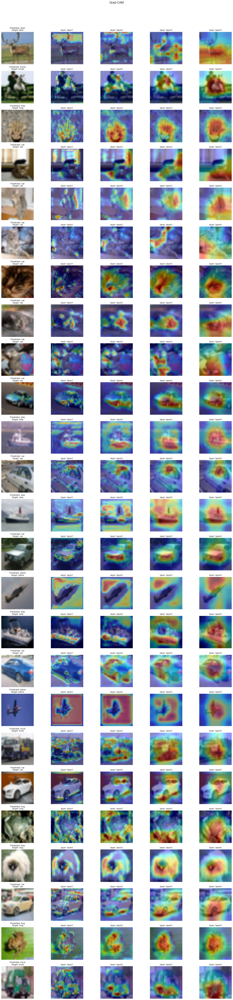

In [15]:
plot_gradcam(gcam_layers, data, target, predicted_classes,classes, denorm)

In [16]:
gcam_layers, predicted_probs, predicted_classes,data,target = load_gradcam(test, model, device, target_layers,classified = False)

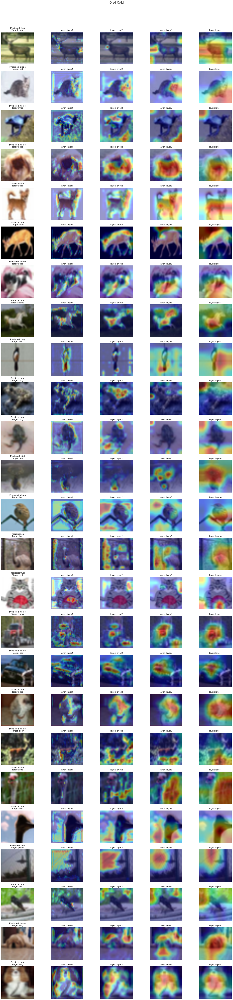

In [17]:
plot_gradcam(gcam_layers, data, target, predicted_classes,classes, denorm)